In [1]:
import sys
sys.path.append('../')
from utils import *
from fig9 import *
import librosa
import pandas as pd
import json
import os
import shutil

### Read metadata file

In [2]:
f = open('Data/metadata.json')
metadata = json.load(f)

In [3]:
# view metadata present in the file
metadata

{'video_path': 'Data/VS_Shree_1235_1321.mp4',
 'vox_audio_path': 'Data/VS_Shree_1235_1321_SS.wav',
 'mix_audio_path': 'Data/VS_Shree_1235_1321.mp4',
 'start_time': 0,
 'duration': None,
 'min_pitch': 164.81,
 'max_pitch': 659.25,
 'annotation_path': 'Data/Observer.csv',
 'temp_folder': 'Data/Temp/',
 'vid_size': [720, 576],
 'Tap_S': {'pos1': [325, 325], 'pos2': [365, 365], 'color': [255, 0, 0]},
 'Tap_H': {'pos1': [462, 325], 'pos2': [502, 365], 'color': [0, 255, 0]},
 'Tan_S': {'pos1': [224, 210], 'pos2': [264, 250], 'color': [0, 0, 255]},
 'Tan_L': {'pos1': [104, 187], 'pos2': [144, 227], 'color': [255, 255, 0]},
 'Tan_R': {'pos1': [340, 152], 'pos2': [380, 192], 'color': [0, 255, 255]},
 'tonic': 220,
 'notes': [{'label': 'P_', 'cents': -500},
  {'label': 'd_', 'cents': -400},
  {'label': 'N_', 'cents': -100},
  {'label': 'S', 'cents': 0},
  {'label': 'r', 'cents': 100},
  {'label': 'G', 'cents': 400},
  {'label': 'm', 'cents': 600},
  {'label': 'P', 'cents': 700},
  {'label': 'd',

There are annotations available for the movement of 5 hands. The annotations that are to be displayed in the graphs and video below will have to be provided as keywords to the functions. Below are a list of the possible keywords:
<ol>
    <li> 'Tap_S': Hand taps of the singer</li>
    <li> 'Tap_H': Hand taps of the harmonium player</li>
    <li> 'Tan_S': Hand with tanpura of the singer</li>
    <li> 'Tan_L': Hand with tanpura of the person to the left of the singer (from viewer's perspective</li>
    <li> 'Tan_R': Hand with tanpura of the person to the right of the singer (from viewer's perspective</li>

In [6]:
# store the keywords in an array which will be used throughout this notebook
annotation_keywords = ['Tap_S', 'Tap_H']

In [7]:
# extract positions and colours into lists for the given annotation_keywords
pos = [[metadata[keyword]['pos1'], metadata[keyword]['pos2']] for keyword in annotation_keywords]
colors = np.array([np.array(metadata[keyword]['color']) for keyword in annotation_keywords]).astype('int16')


### Play the video being analysed

In [6]:
playVideo(videoPath=metadata['video_path'])

### Listen to the source-separated vocal audio:
The audio from this file has been processed to isolate the vocals. This was done using Spleeter: 4 stems model (https://github.com/deezer/spleeter). This audio will be used for pitch tracking (done below)

In [7]:
playAudio(audioPath=metadata['vox_audio_path'])

### Initialise and populate the figure

#### Figure with 0.8 opacity for the annotation lines

In [4]:
%%capture
# initialise figure, with 3 subplots
fig, axs = generateFig(3, (14, 14), [2, 3, 3])

In [8]:
# plot waveplot
# axs[0] = drawWave(audioPath=metadata['mix_audio_path'], startTime=metadata['start_time'], duration=metadata['duration'], ax=axs[0])
# plot spectrogram
# axs[1] = spectrogram(audioPath=metadata['vox_audio_path'], startTime=metadata['start_time'], duration=metadata['duration'], cmap='Blues', ax=axs[1], yticks=True)
# plot pitch contour
axs[2] = pitchCountour(audioPath=metadata['vox_audio_path'], startTime=metadata['start_time'], duration=metadata['duration'], minPitch=metadata['min_pitch'], maxPitch=metadata['max_pitch'], notes=metadata['notes'], tonic=metadata['tonic'], ax=axs[2], annotate=True, onsetPath=metadata['annotation_path'], xticks=True, yticks=True, onsetTimeKeyword=annotation_keywords, cAnnot=list(colors/255), annotLabel=False, ylim=(-600, 900), annotAlpha=0.8)

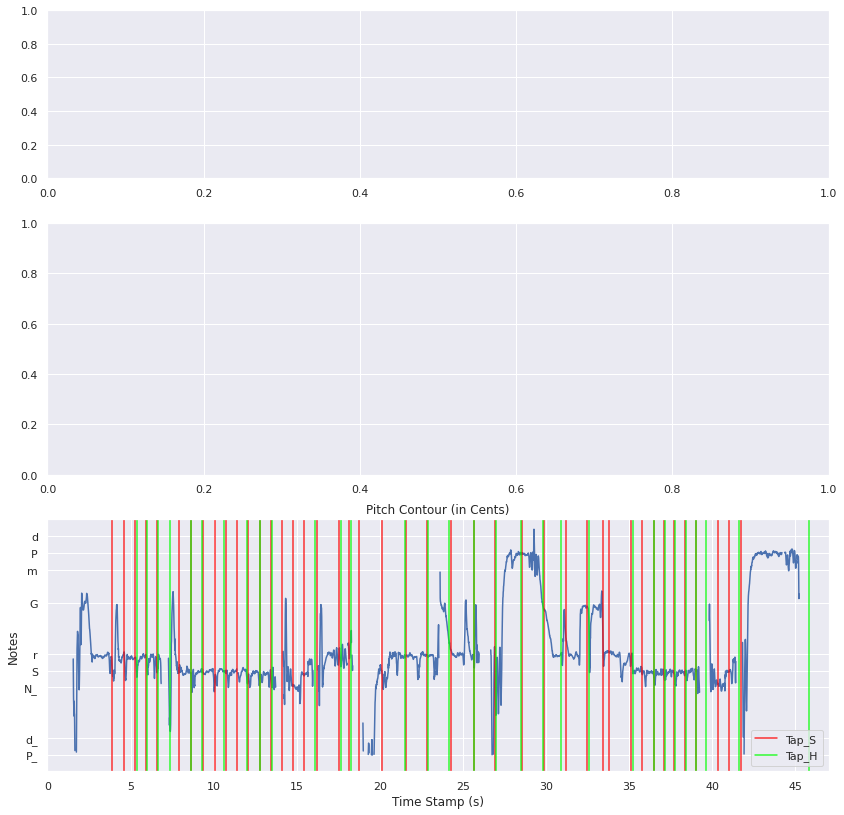

In [9]:
fig

#### Figure with 0.4 opacity for the annotation lines

In [11]:
%%capture
# initialise figure, with 3 subplots
fig, axs = generateFig(3, (14, 14), [2, 3, 3])

In [12]:
# plot waveplot
axs[0] = drawWave(audioPath=metadata['mix_audio_path'], startTime=metadata['start_time'], duration=metadata['duration'], ax=axs[0])
# plot spectrogram
axs[1] = spectrogram(audioPath=metadata['vox_audio_path'], startTime=metadata['start_time'], duration=metadata['duration'], cmap='Blues', ax=axs[1], yticks=True)
# plot pitch contour
axs[2] = pitchCountour(audioPath=metadata['vox_audio_path'], startTime=metadata['start_time'], duration=metadata['duration'], minPitch=metadata['min_pitch'], maxPitch=metadata['max_pitch'], notes=metadata['notes'], tonic=metadata['tonic'], ax=axs[2], annotate=True, onsetPath=metadata['annotation_path'], xticks=True, yticks=True, onsetTimeKeyword=annotation_keywords, cAnnot=list(colors/255), annotLabel=False, ylim=(-600, 900), annotAlpha=0.4)

/home/nithya/anaconda3/envs/osfVis/lib/python3.9/site-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


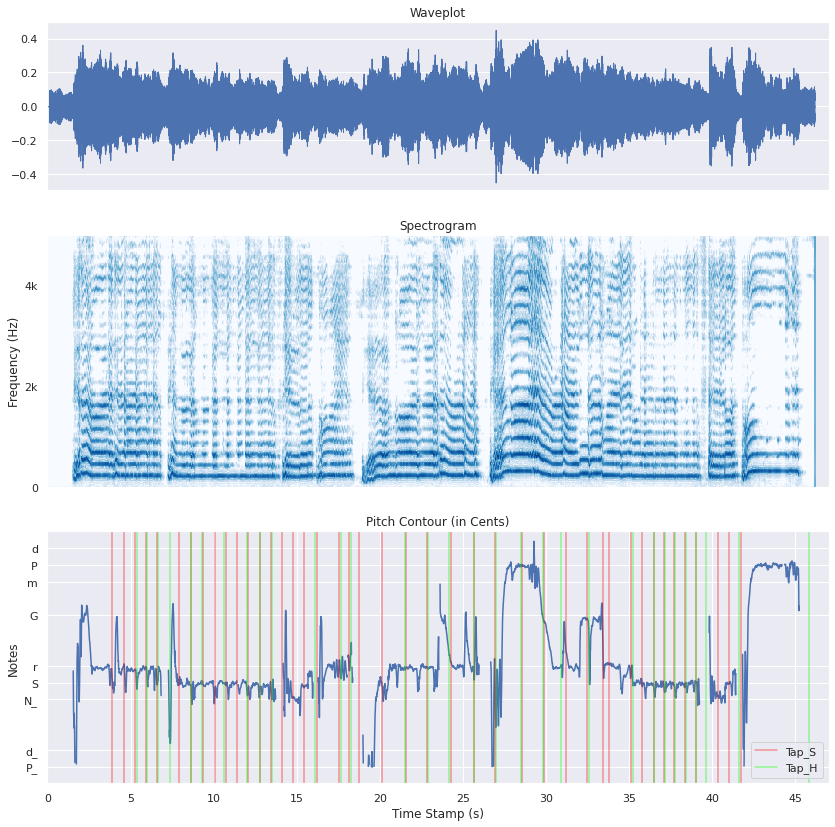

In [13]:
fig

### Create audio with clicks and video with squares

We create a temporary folder to store the edited audios and videos

In [14]:
os.makedirs(metadata['temp_folder'], exist_ok=True)

In [15]:
generateVideo(annotationFile=metadata['annotation_path'], onsetKeywords=annotation_keywords, vidPath=metadata['video_path'], tempFolder=metadata['temp_folder'], pos=pos, cs=colors)

/home/nithya/anaconda3/envs/osfVis/lib/python3.9/site-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Video saved at Data/Temp/finalVid.mp4


#### Play the video

The edited video is stored in the 'Temp' folder under the name 'finalVid.mp4'

In [16]:
playVideo(videoPath=os.path.join(metadata['temp_folder'], 'finalVid.mp4'))

Delete the temporary folder along with the contents that were created in it. The following line can be commented out if you wish to keep the temp folder.

In [17]:
shutil.rmtree(metadata['temp_folder'])